In [8]:
import torch
import pickle
import torch.nn as nn
import matplotlib.pyplot as plt
from torchvision.datasets import MNIST
from torchvision import transforms
import pandas as pd
from scipy import stats
import numpy as np
import seaborn as sns
import plots

In [2]:
train_dataset = MNIST(root='./data', train=True, transform=transforms.ToTensor(), download=True)
test_dataset = MNIST(root='./data', train=False, transform=transforms.ToTensor())
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=64, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=64, shuffle=False)

In [3]:
model_1_expert = torch.load('/Users/galblecher/Desktop/Thesis_out/mnist_naive/naive_fc_1_expert_mnist_model.pkl')
test_acc_1_expert = torch.load('/Users/galblecher/Desktop/Thesis_out/mnist_naive/plots_data/test_accnaive_fc_1_expert_mnist.pkl')

model_2_expert = torch.load('/Users/galblecher/Desktop/Thesis_out/mnist_naive/naive_fc_2_expert_mnist_model.pkl')
test_acc_2_expert = torch.load('/Users/galblecher/Desktop/Thesis_out/mnist_naive/plots_data/test_accnaive_fc_2_expert_mnist.pkl')

model_4_expert = torch.load('/Users/galblecher/Desktop/Thesis_out/mnist_naive/naive_fc_4_expert_mnist_model.pkl')
test_acc_4_expert = torch.load('/Users/galblecher/Desktop/Thesis_out/mnist_naive/plots_data/test_accnaive_fc_4_expert_mnist.pkl')

model_8_expert = torch.load('/Users/galblecher/Desktop/Thesis_out/mnist_naive/naive_fc_8_expert_mnist_model.pkl')
test_acc_8_expert = torch.load('/Users/galblecher/Desktop/Thesis_out/mnist_naive/plots_data/test_accnaive_fc_8_expert_mnist.pkl')

model_16_expert = torch.load('/Users/galblecher/Desktop/Thesis_out/mnist_naive/naive_fc_16_expert_mnist_model.pkl')
test_acc_16_expert = torch.load('/Users/galblecher/Desktop/Thesis_out/mnist_naive/plots_data/test_accnaive_fc_16_expert_mnist.pkl')

In [4]:
model_1_expert

Naive_fc(
  (fc1): Linear(in_features=784, out_features=392, bias=True)
  (fc2): Linear(in_features=392, out_features=2, bias=True)
  (fc3): Linear(in_features=2, out_features=10, bias=True)
)

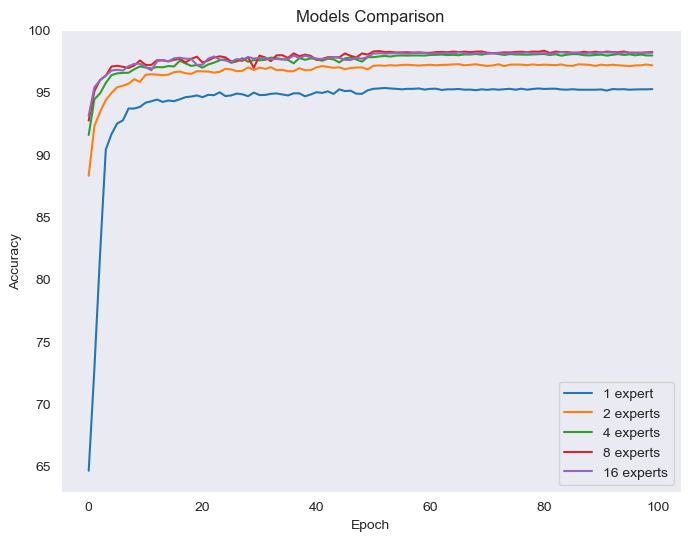

In [5]:
plt.figure(figsize=(8,6))
plt.plot(test_acc_1_expert, label='1 expert')
plt.plot(test_acc_2_expert, label='2 experts')
plt.plot(test_acc_4_expert, label='4 experts')
plt.plot(test_acc_8_expert, label='8 experts')
plt.plot(test_acc_16_expert, label='16 experts')
plt.grid()
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Models Comparison')
plt.legend();

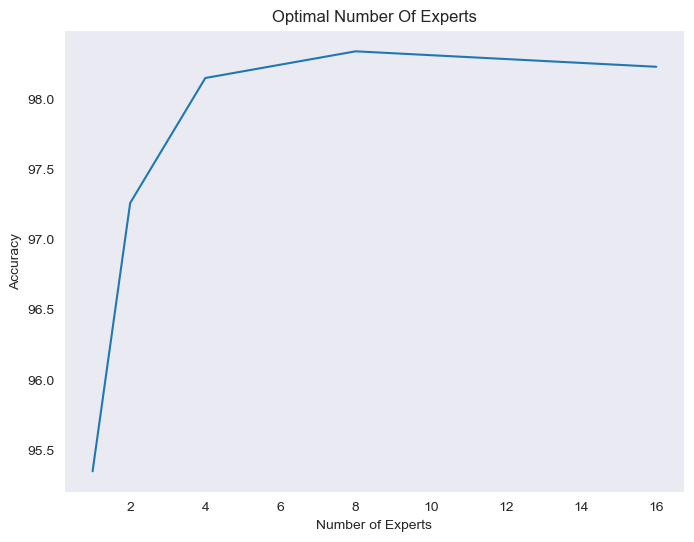

In [6]:
plt.figure(figsize=(8,6))
improve_list = [95.35, 97.26, 98.15, 98.34, 98.23]
n_experts = [1, 2, 4, 8, 16]
plt.plot(n_experts,improve_list)
plt.grid()
plt.xlabel('Number of Experts')
plt.ylabel('Accuracy')
plt.title('Optimal Number Of Experts');

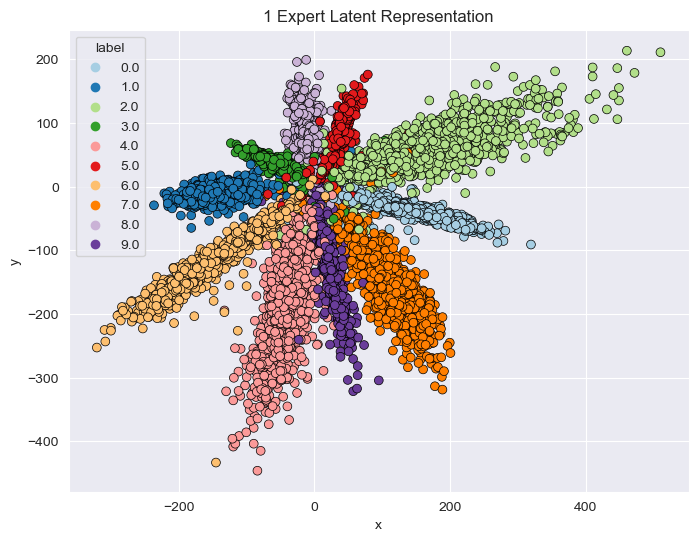

In [9]:
plt.figure(figsize=(8,6))
points_df = plots.plot_data_latent(model_1_expert, test_loader, plot_boundary=None, show=True)

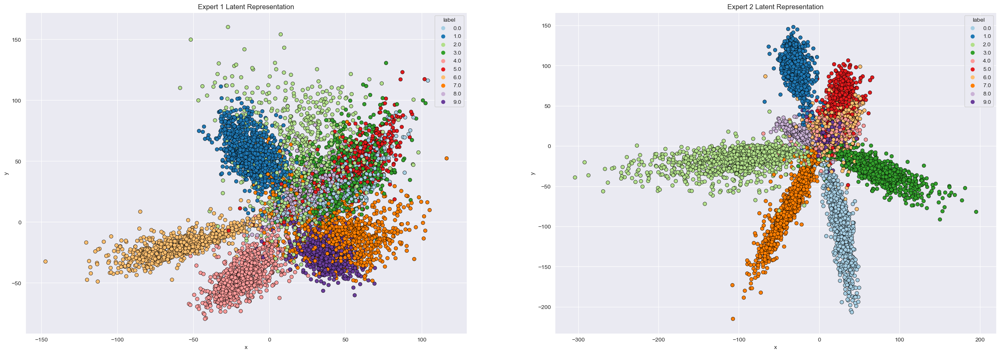

In [10]:
points_df_expert1 = plots.plot_data_latent(model_2_expert.expert1, test_loader, plot_boundary=None, show=False)
points_df_expert2 = plots.plot_data_latent(model_2_expert.expert2, test_loader, plot_boundary=None, show=False)

fig, ax = plt.subplots(1, 2, figsize=(30,10))
sns.scatterplot(ax=ax[0], data=points_df_expert1, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 1 Latent Representation')
sns.scatterplot(ax=ax[1], data=points_df_expert2, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 2 Latent Representation');

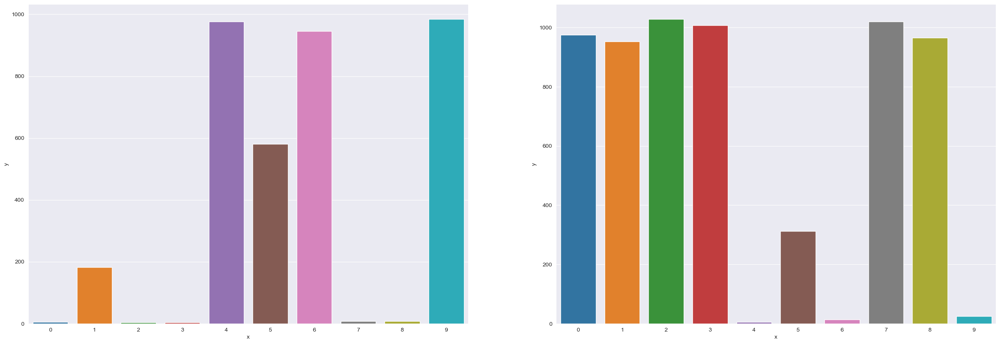

In [12]:
dominant_dict = plots.experts_areas(model_2_expert, test_loader)
dominant_df_expert_1 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['0']})
dominant_df_expert_2 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['1']})

fig, ax = plt.subplots(1, 2, figsize=(30,10))

sns.barplot(ax=ax[0], x='x', y='y', data=dominant_df_expert_1)
sns.barplot(ax=ax[1], x='x', y='y', data=dominant_df_expert_2);

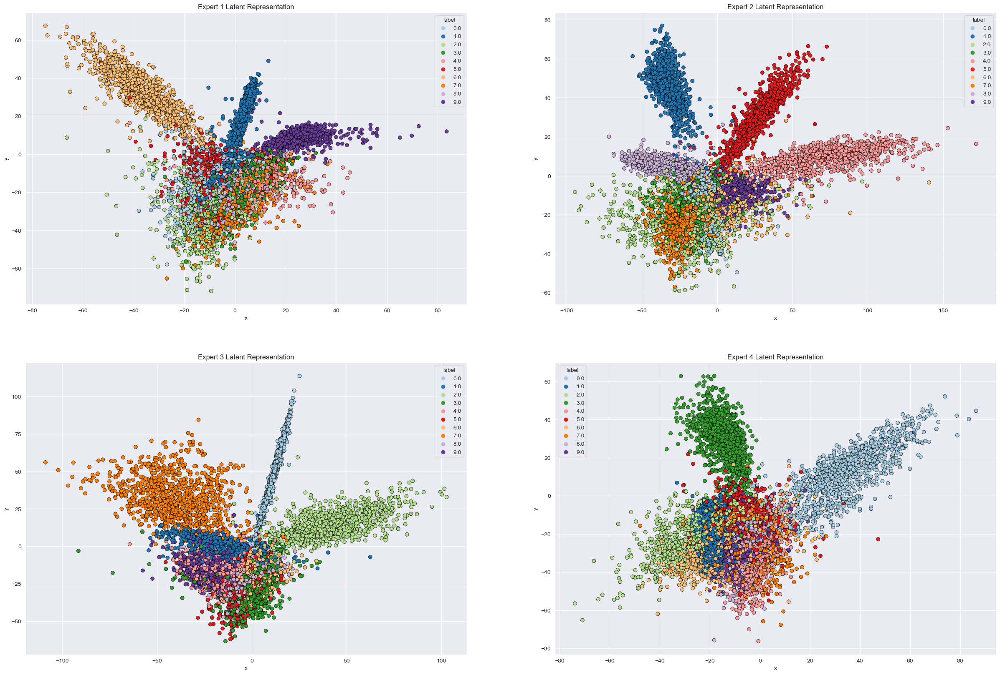

In [14]:
points_df_expert1 = plots.plot_data_latent(model_4_expert.expert1, test_loader, plot_boundary=None, show=False)
points_df_expert2 = plots.plot_data_latent(model_4_expert.expert2, test_loader, plot_boundary=None, show=False)
points_df_expert3 = plots.plot_data_latent(model_4_expert.expert3, test_loader, plot_boundary=None, show=False)
points_df_expert4 = plots.plot_data_latent(model_4_expert.expert4, test_loader, plot_boundary=None, show=False)

fig, ax = plt.subplots(2, 2, figsize=(30,20))

sns.scatterplot(ax=ax[0,0], data=points_df_expert1, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 1 Latent Representation')
sns.scatterplot(ax=ax[0,1], data=points_df_expert2, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 2 Latent Representation')
sns.scatterplot(ax=ax[1,0], data=points_df_expert3, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 3 Latent Representation')
sns.scatterplot(ax=ax[1,1], data=points_df_expert4, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 4 Latent Representation');

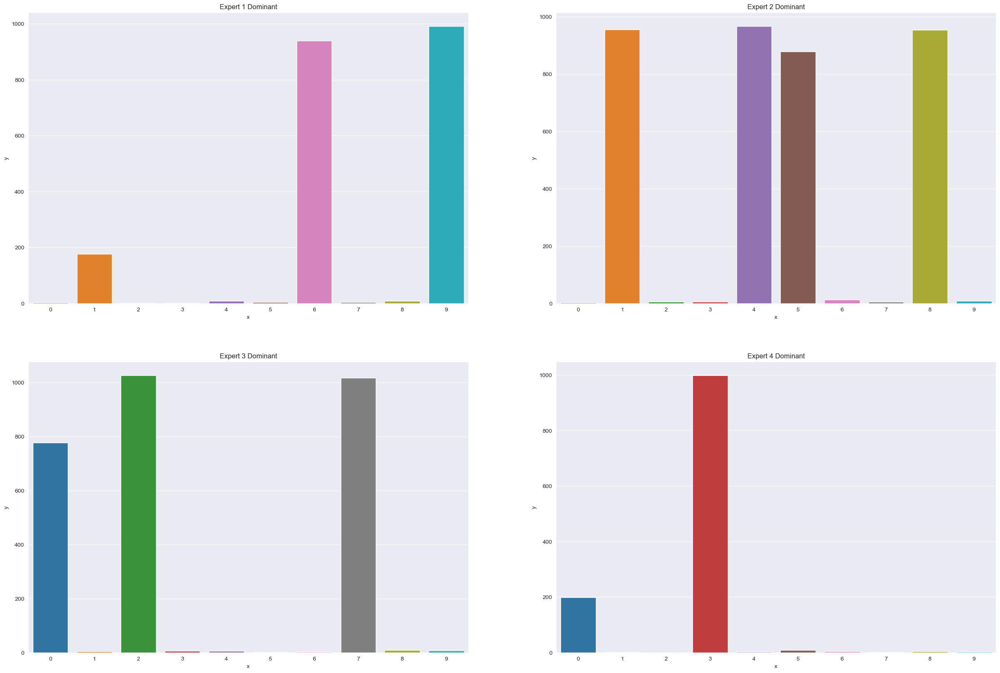

In [15]:
dominant_dict = plots.experts_areas(model_4_expert, test_loader)
dominant_df_expert_1 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['0']})
dominant_df_expert_2 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['1']})
dominant_df_expert_3 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['2']})
dominant_df_expert_4 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['3']})

fig, ax = plt.subplots(2, 2, figsize=(30,20))

sns.barplot(ax=ax[0,0], x='x', y='y', data=dominant_df_expert_1).set(title='Expert 1 Dominant')
sns.barplot(ax=ax[0,1], x='x', y='y', data=dominant_df_expert_2).set(title='Expert 2 Dominant')
sns.barplot(ax=ax[1,0], x='x', y='y', data=dominant_df_expert_3).set(title='Expert 3 Dominant')
sns.barplot(ax=ax[1,1], x='x', y='y', data=dominant_df_expert_4).set(title='Expert 4 Dominant');

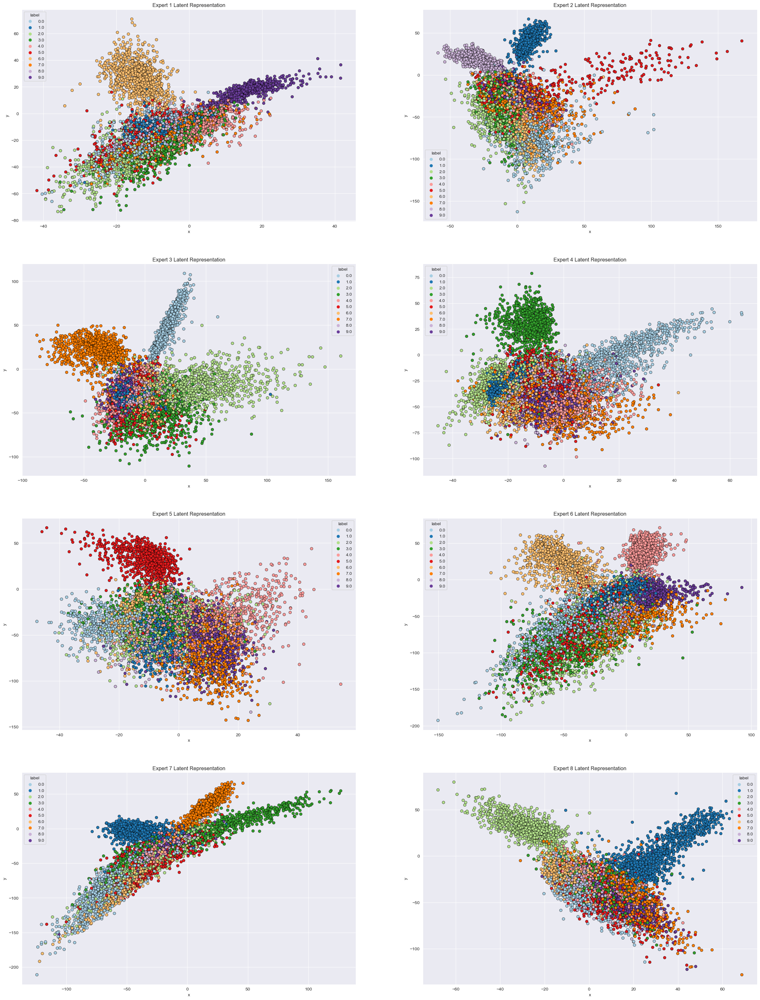

In [17]:
points_df_expert1 = plots.plot_data_latent(model_8_expert.expert1, test_loader, plot_boundary=None, show=False)
points_df_expert2 = plots.plot_data_latent(model_8_expert.expert2, test_loader, plot_boundary=None, show=False)
points_df_expert3 = plots.plot_data_latent(model_8_expert.expert3, test_loader, plot_boundary=None, show=False)
points_df_expert4 = plots.plot_data_latent(model_8_expert.expert4, test_loader, plot_boundary=None, show=False)
points_df_expert5 = plots.plot_data_latent(model_8_expert.expert5, test_loader, plot_boundary=None, show=False)
points_df_expert6 = plots.plot_data_latent(model_8_expert.expert6, test_loader, plot_boundary=None, show=False)
points_df_expert7 = plots.plot_data_latent(model_8_expert.expert7, test_loader, plot_boundary=None, show=False)
points_df_expert8 = plots.plot_data_latent(model_8_expert.expert8, test_loader, plot_boundary=None, show=False)

fig, ax = plt.subplots(4, 2, figsize=(30,40))

sns.scatterplot(ax=ax[0,0], data=points_df_expert1, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 1 Latent Representation')
sns.scatterplot(ax=ax[0,1], data=points_df_expert2, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 2 Latent Representation')
sns.scatterplot(ax=ax[1,0], data=points_df_expert3, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 3 Latent Representation')
sns.scatterplot(ax=ax[1,1], data=points_df_expert4, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 4 Latent Representation')
sns.scatterplot(ax=ax[2,0], data=points_df_expert5, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 5 Latent Representation')
sns.scatterplot(ax=ax[2,1], data=points_df_expert6, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 6 Latent Representation')
sns.scatterplot(ax=ax[3,0], data=points_df_expert7, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 7 Latent Representation')
sns.scatterplot(ax=ax[3,1], data=points_df_expert8, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 8 Latent Representation');

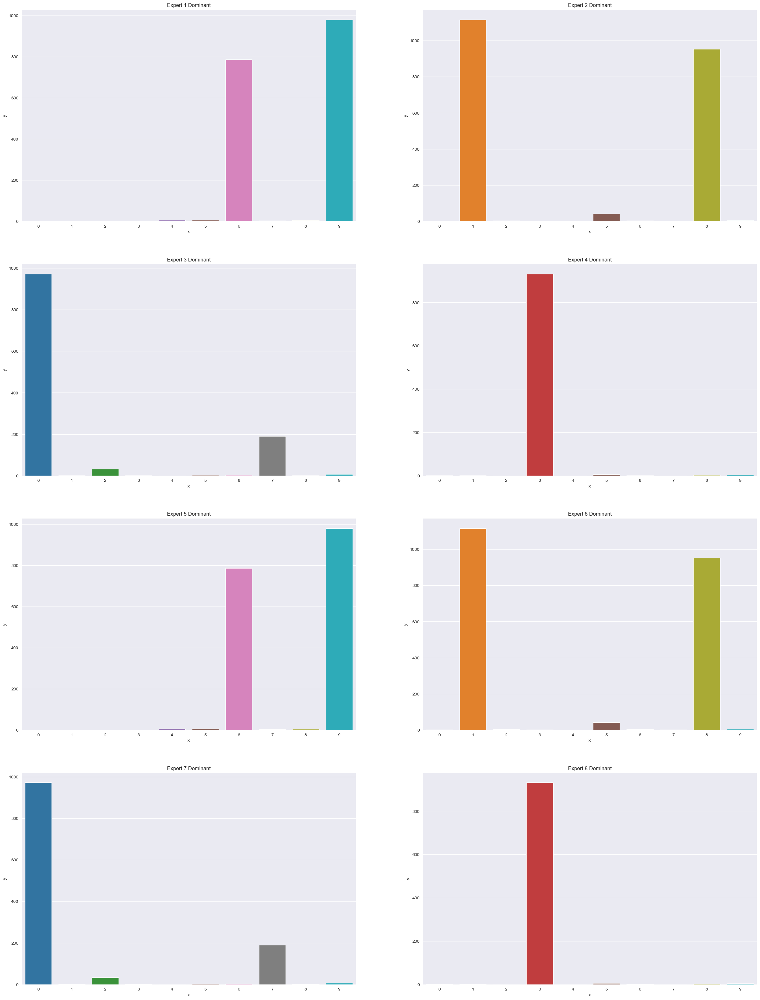

In [18]:
dominant_dict = plots.experts_areas(model_8_expert, test_loader)
dominant_df_expert_1 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['0']})
dominant_df_expert_2 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['1']})
dominant_df_expert_3 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['2']})
dominant_df_expert_4 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['3']})
dominant_df_expert_5 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['0']})
dominant_df_expert_6 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['1']})
dominant_df_expert_7 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['2']})
dominant_df_expert_8 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['3']})

fig, ax = plt.subplots(4, 2, figsize=(30,40))

sns.barplot(ax=ax[0,0], x='x', y='y', data=dominant_df_expert_1).set(title='Expert 1 Dominant')
sns.barplot(ax=ax[0,1], x='x', y='y', data=dominant_df_expert_2).set(title='Expert 2 Dominant')
sns.barplot(ax=ax[1,0], x='x', y='y', data=dominant_df_expert_3).set(title='Expert 3 Dominant')
sns.barplot(ax=ax[1,1], x='x', y='y', data=dominant_df_expert_4).set(title='Expert 4 Dominant')
sns.barplot(ax=ax[2,0], x='x', y='y', data=dominant_df_expert_5).set(title='Expert 5 Dominant')
sns.barplot(ax=ax[2,1], x='x', y='y', data=dominant_df_expert_6).set(title='Expert 6 Dominant')
sns.barplot(ax=ax[3,0], x='x', y='y', data=dominant_df_expert_7).set(title='Expert 7 Dominant')
sns.barplot(ax=ax[3,1], x='x', y='y', data=dominant_df_expert_8).set(title='Expert 8 Dominant');

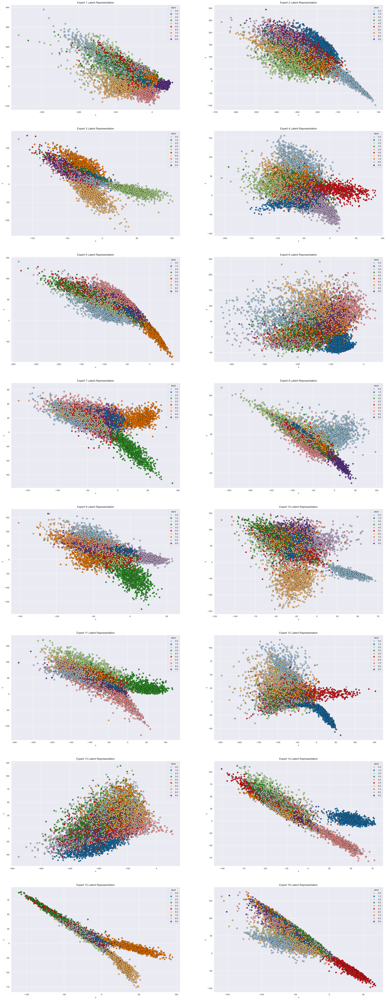

In [19]:
points_df_expert1 = plots.plot_data_latent(model_16_expert.expert1, test_loader, plot_boundary=None, show=False)
points_df_expert2 = plots.plot_data_latent(model_16_expert.expert2, test_loader, plot_boundary=None, show=False)
points_df_expert3 = plots.plot_data_latent(model_16_expert.expert3, test_loader, plot_boundary=None, show=False)
points_df_expert4 = plots.plot_data_latent(model_16_expert.expert4, test_loader, plot_boundary=None, show=False)
points_df_expert5 = plots.plot_data_latent(model_16_expert.expert5, test_loader, plot_boundary=None, show=False)
points_df_expert6 = plots.plot_data_latent(model_16_expert.expert6, test_loader, plot_boundary=None, show=False)
points_df_expert7 = plots.plot_data_latent(model_16_expert.expert7, test_loader, plot_boundary=None, show=False)
points_df_expert8 = plots.plot_data_latent(model_16_expert.expert8, test_loader, plot_boundary=None, show=False)
points_df_expert9 = plots.plot_data_latent(model_16_expert.expert9, test_loader, plot_boundary=None, show=False)
points_df_expert10 = plots.plot_data_latent(model_16_expert.expert10, test_loader, plot_boundary=None, show=False)
points_df_expert11 = plots.plot_data_latent(model_16_expert.expert11, test_loader, plot_boundary=None, show=False)
points_df_expert12 = plots.plot_data_latent(model_16_expert.expert12, test_loader, plot_boundary=None, show=False)
points_df_expert13 = plots.plot_data_latent(model_16_expert.expert13, test_loader, plot_boundary=None, show=False)
points_df_expert14 = plots.plot_data_latent(model_16_expert.expert14, test_loader, plot_boundary=None, show=False)
points_df_expert15 = plots.plot_data_latent(model_16_expert.expert15, test_loader, plot_boundary=None, show=False)
points_df_expert16 = plots.plot_data_latent(model_16_expert.expert16, test_loader, plot_boundary=None, show=False)

fig, ax = plt.subplots(8, 2, figsize=(30,80))

sns.scatterplot(ax=ax[0,0], data=points_df_expert1, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 1 Latent Representation')
sns.scatterplot(ax=ax[0,1], data=points_df_expert2, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 2 Latent Representation')
sns.scatterplot(ax=ax[1,0], data=points_df_expert3, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 3 Latent Representation')
sns.scatterplot(ax=ax[1,1], data=points_df_expert4, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 4 Latent Representation')
sns.scatterplot(ax=ax[2,0], data=points_df_expert5, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 5 Latent Representation')
sns.scatterplot(ax=ax[2,1], data=points_df_expert6, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 6 Latent Representation')
sns.scatterplot(ax=ax[3,0], data=points_df_expert7, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 7 Latent Representation')
sns.scatterplot(ax=ax[3,1], data=points_df_expert8, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 8 Latent Representation')
sns.scatterplot(ax=ax[4,0], data=points_df_expert9, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 9 Latent Representation')
sns.scatterplot(ax=ax[4,1], data=points_df_expert10, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 10 Latent Representation')
sns.scatterplot(ax=ax[5,0], data=points_df_expert11, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 11 Latent Representation')
sns.scatterplot(ax=ax[5,1], data=points_df_expert12, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 12 Latent Representation')
sns.scatterplot(ax=ax[6,0], data=points_df_expert13, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 13 Latent Representation')
sns.scatterplot(ax=ax[6,1], data=points_df_expert14, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 14 Latent Representation')
sns.scatterplot(ax=ax[7,0], data=points_df_expert15, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 15 Latent Representation')
sns.scatterplot(ax=ax[7,1], data=points_df_expert16, x='x', y='y', hue='label', palette='Paired', edgecolor="black",
                s=40, legend='full').set(title='Expert 16 Latent Representation');

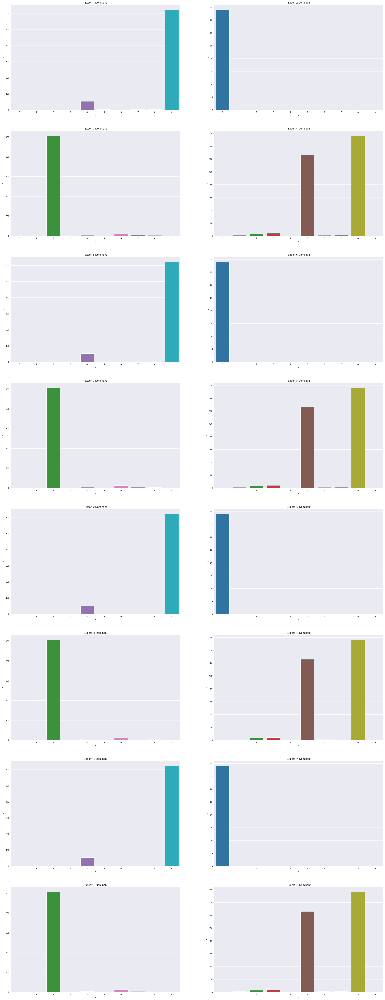

In [20]:
dominant_dict = plots.experts_areas(model_16_expert, test_loader)
dominant_df_expert_1 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['0']})
dominant_df_expert_2 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['1']})
dominant_df_expert_3 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['2']})
dominant_df_expert_4 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['3']})
dominant_df_expert_5 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['0']})
dominant_df_expert_6 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['1']})
dominant_df_expert_7 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['2']})
dominant_df_expert_8 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['3']})
dominant_df_expert_9 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['0']})
dominant_df_expert_10 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['1']})
dominant_df_expert_11 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['2']})
dominant_df_expert_12 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['3']})
dominant_df_expert_13 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['0']})
dominant_df_expert_14 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['1']})
dominant_df_expert_15 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['2']})
dominant_df_expert_16 = pd.DataFrame({'x': np.arange(10), 'y': dominant_dict['3']})

fig, ax = plt.subplots(8, 2, figsize=(30,80))

sns.barplot(ax=ax[0,0], x='x', y='y', data=dominant_df_expert_1).set(title='Expert 1 Dominant')
sns.barplot(ax=ax[0,1], x='x', y='y', data=dominant_df_expert_2).set(title='Expert 2 Dominant')
sns.barplot(ax=ax[1,0], x='x', y='y', data=dominant_df_expert_3).set(title='Expert 3 Dominant')
sns.barplot(ax=ax[1,1], x='x', y='y', data=dominant_df_expert_4).set(title='Expert 4 Dominant')
sns.barplot(ax=ax[2,0], x='x', y='y', data=dominant_df_expert_5).set(title='Expert 5 Dominant')
sns.barplot(ax=ax[2,1], x='x', y='y', data=dominant_df_expert_6).set(title='Expert 6 Dominant')
sns.barplot(ax=ax[3,0], x='x', y='y', data=dominant_df_expert_7).set(title='Expert 7 Dominant')
sns.barplot(ax=ax[3,1], x='x', y='y', data=dominant_df_expert_8).set(title='Expert 8 Dominant')
sns.barplot(ax=ax[4,0], x='x', y='y', data=dominant_df_expert_9).set(title='Expert 9 Dominant')
sns.barplot(ax=ax[4,1], x='x', y='y', data=dominant_df_expert_10).set(title='Expert 10 Dominant')
sns.barplot(ax=ax[5,0], x='x', y='y', data=dominant_df_expert_11).set(title='Expert 11 Dominant')
sns.barplot(ax=ax[5,1], x='x', y='y', data=dominant_df_expert_12).set(title='Expert 12 Dominant')
sns.barplot(ax=ax[6,0], x='x', y='y', data=dominant_df_expert_13).set(title='Expert 13 Dominant')
sns.barplot(ax=ax[6,1], x='x', y='y', data=dominant_df_expert_14).set(title='Expert 14 Dominant')
sns.barplot(ax=ax[7,0], x='x', y='y', data=dominant_df_expert_15).set(title='Expert 15 Dominant')
sns.barplot(ax=ax[7,1], x='x', y='y', data=dominant_df_expert_16).set(title='Expert 16 Dominant');